In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.dates as mdates
xformatter = mdates.DateFormatter('%H:%M') # for time axis plots

# import plotly.offline as py
# py.init_notebook_mode(connected=True)


import sklearn
from scipy.optimize import curve_fit

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns',500)
pd.set_option('display.max_rows',500)

In [2]:
generation_data_plant1 = pd.read_csv('Plant_1_Generation_Data.csv')
generation_data_plant1

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,15-05-2020 00:00,4135001,1BY6WEcLGh8j5v7,0.0,0.0,0.000,6259559.0
1,15-05-2020 00:00,4135001,1IF53ai7Xc0U56Y,0.0,0.0,0.000,6183645.0
2,15-05-2020 00:00,4135001,3PZuoBAID5Wc2HD,0.0,0.0,0.000,6987759.0
3,15-05-2020 00:00,4135001,7JYdWkrLSPkdwr4,0.0,0.0,0.000,7602960.0
4,15-05-2020 00:00,4135001,McdE0feGgRqW7Ca,0.0,0.0,0.000,7158964.0
...,...,...,...,...,...,...,...
68773,17-06-2020 23:45,4135001,uHbuxQJl8lW7ozc,0.0,0.0,5967.000,7287002.0
68774,17-06-2020 23:45,4135001,wCURE6d3bPkepu2,0.0,0.0,5147.625,7028601.0
68775,17-06-2020 23:45,4135001,z9Y9gH1T5YWrNuG,0.0,0.0,5819.000,7251204.0
68776,17-06-2020 23:45,4135001,zBIq5rxdHJRwDNY,0.0,0.0,5817.000,6583369.0


In [3]:
generation_data_plant1.describe().T

,count,mean,std,min,25%,50%,75%,max
PLANT_ID,68778.0,4.135001e+06,0.000000,4135001.0,4.135001e+06,4.135001e+06,4.135001e+06,4135001.000
DC_POWER,68778.0,3.147426e+03,4036.457169,0.0,0.000000e+00,4.290000e+02,6.366964e+03,14471.125
AC_POWER,68778.0,3.078028e+02,394.396439,0.0,0.000000e+00,4.149375e+01,6.236187e+02,1410.950
DAILY_YIELD,68778.0,3.295969e+03,3145.178309,0.0,0.000000e+00,2.658714e+03,6.274000e+03,9163.000
TOTAL_YIELD,68778.0,6.978712e+06,416271.982856,6183645.0,6.512003e+06,7.146685e+06,7.268706e+06,7846821.000


In [4]:
generation_data_plant1.dtypes     

DATE_TIME       object
PLANT_ID         int64
SOURCE_KEY      object
DC_POWER       float64
AC_POWER       float64
DAILY_YIELD    float64
TOTAL_YIELD    float64
dtype: object

In [5]:
weather_data_plant1 = pd.read_csv('Plant_1_Weather_Sensor_Data.csv')
weather_data_plant1

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4135001,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0
1,2020-05-15 00:15:00,4135001,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0
2,2020-05-15 00:30:00,4135001,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0
3,2020-05-15 00:45:00,4135001,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0
4,2020-05-15 01:00:00,4135001,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0
...,...,...,...,...,...,...
3177,2020-06-17 22:45:00,4135001,HmiyD2TTLFNqkNe,22.150570,21.480377,0.0
3178,2020-06-17 23:00:00,4135001,HmiyD2TTLFNqkNe,22.129816,21.389024,0.0
3179,2020-06-17 23:15:00,4135001,HmiyD2TTLFNqkNe,22.008275,20.709211,0.0
3180,2020-06-17 23:30:00,4135001,HmiyD2TTLFNqkNe,21.969495,20.734963,0.0


In [6]:
weather_data_plant1.describe().T

,count,mean,std,min,25%,50%,75%,max
PLANT_ID,3182.0,4.135001e+06,0.000000,4.135001e+06,4.135001e+06,4.135001e+06,4.135001e+06,4.135001e+06
AMBIENT_TEMPERATURE,3182.0,2.553161e+01,3.354856,2.039850e+01,2.270518e+01,2.461381e+01,2.792053e+01,3.525249e+01
MODULE_TEMPERATURE,3182.0,3.109102e+01,12.261222,1.814042e+01,2.109055e+01,2.461806e+01,4.130784e+01,6.554571e+01
IRRADIATION,3182.0,2.283128e-01,0.300836,0.000000e+00,0.000000e+00,2.465348e-02,4.495884e-01,1.221652e+00


In [7]:
weather_data_plant1.dtypes  

DATE_TIME               object
PLANT_ID                 int64
SOURCE_KEY              object
AMBIENT_TEMPERATURE    float64
MODULE_TEMPERATURE     float64
IRRADIATION            float64
dtype: object

In [8]:
generation_data_plant2 = pd.read_csv('Plant_2_Generation_Data.csv')
generation_data_plant2

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,2020-05-15 00:00:00,4136001,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06
1,2020-05-15 00:00:00,4136001,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09
2,2020-05-15 00:00:00,4136001,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09
3,2020-05-15 00:00:00,4136001,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06
4,2020-05-15 00:00:00,4136001,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07
...,...,...,...,...,...,...,...
67693,2020-06-17 23:45:00,4136001,q49J1IKaHRwDQnt,0.0,0.0,4157.000000,5.207580e+05
67694,2020-06-17 23:45:00,4136001,rrq4fwE8jgrTyWY,0.0,0.0,3931.000000,1.211314e+08
67695,2020-06-17 23:45:00,4136001,vOuJvMaM2sgwLmb,0.0,0.0,4322.000000,2.427691e+06
67696,2020-06-17 23:45:00,4136001,xMbIugepa2P7lBB,0.0,0.0,4218.000000,1.068964e+08


In [9]:
generation_data_plant2.describe().T

,count,mean,std,min,25%,50%,75%,max
PLANT_ID,67698.0,4.136001e+06,0.000000e+00,4136001.0,4.136001e+06,4136001.0,4.136001e+06,4.136001e+06
DC_POWER,67698.0,2.467020e+02,3.705696e+02,0.0,0.000000e+00,0.0,4.465917e+02,1.420933e+03
AC_POWER,67698.0,2.412778e+02,3.621121e+02,0.0,0.000000e+00,0.0,4.382150e+02,1.385420e+03
DAILY_YIELD,67698.0,3.294890e+03,2.919448e+03,0.0,2.727500e+02,2911.0,5.534000e+03,9.873000e+03
TOTAL_YIELD,67698.0,6.589448e+08,7.296678e+08,0.0,1.996494e+07,282627587.0,1.348495e+09,2.247916e+09


In [10]:
generation_data_plant2.dtypes

DATE_TIME       object
PLANT_ID         int64
SOURCE_KEY      object
DC_POWER       float64
AC_POWER       float64
DAILY_YIELD    float64
TOTAL_YIELD    float64
dtype: object

In [11]:
weather_data_plant2 = pd.read_csv('Plant_2_Weather_Sensor_Data.csv')
weather_data_plant2

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4136001,iq8k7ZNt4Mwm3w0,27.004764,25.060789,0.0
1,2020-05-15 00:15:00,4136001,iq8k7ZNt4Mwm3w0,26.880811,24.421869,0.0
2,2020-05-15 00:30:00,4136001,iq8k7ZNt4Mwm3w0,26.682055,24.427290,0.0
3,2020-05-15 00:45:00,4136001,iq8k7ZNt4Mwm3w0,26.500589,24.420678,0.0
4,2020-05-15 01:00:00,4136001,iq8k7ZNt4Mwm3w0,26.596148,25.088210,0.0
...,...,...,...,...,...,...
3254,2020-06-17 22:45:00,4136001,iq8k7ZNt4Mwm3w0,23.511703,22.856201,0.0
3255,2020-06-17 23:00:00,4136001,iq8k7ZNt4Mwm3w0,23.482282,22.744190,0.0
3256,2020-06-17 23:15:00,4136001,iq8k7ZNt4Mwm3w0,23.354743,22.492245,0.0
3257,2020-06-17 23:30:00,4136001,iq8k7ZNt4Mwm3w0,23.291048,22.373909,0.0


In [12]:
weather_data_plant2.describe()

,PLANT_ID,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
count,3259.0,3259.000000,3259.000000,3259.000000
mean,4136001.0,28.069400,32.772408,0.232737
std,0.0,4.061556,11.344034,0.312693
min,4136001.0,20.942385,20.265123,0.000000
25%,4136001.0,24.602135,23.716881,0.000000
50%,4136001.0,26.981263,27.534606,0.019040
75%,4136001.0,31.056757,40.480653,0.438717
max,4136001.0,39.181638,66.635953,1.098766


In [13]:
weather_data_plant2.dtypes

DATE_TIME               object
PLANT_ID                 int64
SOURCE_KEY              object
AMBIENT_TEMPERATURE    float64
MODULE_TEMPERATURE     float64
IRRADIATION            float64
dtype: object

### uyumlarda bi problem yok

In [14]:
generation_data_plant1.isnull().sum().sort_values(ascending=False)

DATE_TIME      0
PLANT_ID       0
SOURCE_KEY     0
DC_POWER       0
AC_POWER       0
DAILY_YIELD    0
TOTAL_YIELD    0
dtype: int64

In [15]:
generation_data_plant2.isnull().sum().sort_values(ascending=False)

DATE_TIME      0
PLANT_ID       0
SOURCE_KEY     0
DC_POWER       0
AC_POWER       0
DAILY_YIELD    0
TOTAL_YIELD    0
dtype: int64

In [16]:
weather_data_plant1.isnull().sum().sort_values(ascending=False)

DATE_TIME              0
PLANT_ID               0
SOURCE_KEY             0
AMBIENT_TEMPERATURE    0
MODULE_TEMPERATURE     0
IRRADIATION            0
dtype: int64

In [17]:
weather_data_plant2.isnull().sum().sort_values(ascending=False)

DATE_TIME              0
PLANT_ID               0
SOURCE_KEY             0
AMBIENT_TEMPERATURE    0
MODULE_TEMPERATURE     0
IRRADIATION            0
dtype: int64

### boş veri problemi yok

### 15 dkda bir datetime olarak yapalım rahat rahat zaman serisi bakarız

In [18]:
generation_data_plant1['DATE_TIME'] = pd.to_datetime(generation_data_plant1['DATE_TIME'],format = '%d-%m-%Y %H:%M')
weather_data_plant1['DATE_TIME'] = pd.to_datetime(weather_data_plant1['DATE_TIME'],format = '%Y-%m-%d %H:%M:%S')
generation_data_plant2['DATE_TIME'] = pd.to_datetime(generation_data_plant1['DATE_TIME'],format = '%d-%m-%Y %H:%M')
weather_data_plant2['DATE_TIME'] = pd.to_datetime(weather_data_plant1['DATE_TIME'],format = '%Y-%m-%d %H:%M:%S')

In [19]:
df_solar1 = pd.merge(generation_data_plant1.drop(columns = ['PLANT_ID']), weather_data_plant1.drop(columns = ['PLANT_ID', 'SOURCE_KEY']), on='DATE_TIME')

df_solar1.isnull().sum().sort_values(ascending=False)

DATE_TIME              0
SOURCE_KEY             0
DC_POWER               0
AC_POWER               0
DAILY_YIELD            0
TOTAL_YIELD            0
AMBIENT_TEMPERATURE    0
MODULE_TEMPERATURE     0
IRRADIATION            0
dtype: int64

In [20]:
df_solar1

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,0.000,6259559.0,25.184316,22.857507,0.0
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,0.000,6183645.0,25.184316,22.857507,0.0
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,0.000,6987759.0,25.184316,22.857507,0.0
3,2020-05-15 00:00:00,7JYdWkrLSPkdwr4,0.0,0.0,0.000,7602960.0,25.184316,22.857507,0.0
4,2020-05-15 00:00:00,McdE0feGgRqW7Ca,0.0,0.0,0.000,7158964.0,25.184316,22.857507,0.0
...,...,...,...,...,...,...,...,...,...
68769,2020-06-17 23:45:00,uHbuxQJl8lW7ozc,0.0,0.0,5967.000,7287002.0,21.909288,20.427972,0.0
68770,2020-06-17 23:45:00,wCURE6d3bPkepu2,0.0,0.0,5147.625,7028601.0,21.909288,20.427972,0.0
68771,2020-06-17 23:45:00,z9Y9gH1T5YWrNuG,0.0,0.0,5819.000,7251204.0,21.909288,20.427972,0.0
68772,2020-06-17 23:45:00,zBIq5rxdHJRwDNY,0.0,0.0,5817.000,6583369.0,21.909288,20.427972,0.0


In [21]:
sensorkeys = df_solar1.SOURCE_KEY.unique().tolist() # unique sensor keys
sensornumbers = list(range(1,len(sensorkeys)+1)) # sensor number
dict_sensor = dict(zip(sensorkeys, sensornumbers)) # dictionary of sensor numbers and corresponding keys

# add column
df_solar1['SENSOR_NUM'] = 0
for i in range(generation_data_plant1.shape[0]):
    df_solar1['SENSOR_NUM'][i] = dict_sensor[generation_data_plant1["SOURCE_KEY"][i]]

# add Sensor Number as string
df_solar1["SENSOR_NAME"] = df_solar1["SENSOR_NUM"].apply(str)

In [22]:
df_solar1["DATE"] = pd.to_datetime(df_solar1["DATE_TIME"]).dt.date # add new column with date
df_solar1["TIME"] = pd.to_datetime(df_solar1["DATE_TIME"]).dt.time # add new column with time

# add hours and minutes for ml models
df_solar1['HOURS'] = pd.to_datetime(df_solar1['TIME'],format='%H:%M:%S').dt.hour
df_solar1['MINUTES'] = pd.to_datetime(df_solar1['TIME'],format='%H:%M:%S').dt.minute
df_solar1['MINUTES_PASS'] = df_solar1['MINUTES'] + df_solar1['HOURS']*60

# add date as string column
df_solar1["DATE_STR"] = df_solar1["DATE"].astype(str)

In [23]:
df_solar1

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,0.000,6259559.0,25.184316,22.857507,0.0,1,1,2020-05-15,00:00:00,0,0,0,2020-05-15
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,0.000,6183645.0,25.184316,22.857507,0.0,2,2,2020-05-15,00:00:00,0,0,0,2020-05-15
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,0.000,6987759.0,25.184316,22.857507,0.0,3,3,2020-05-15,00:00:00,0,0,0,2020-05-15
3,2020-05-15 00:00:00,7JYdWkrLSPkdwr4,0.0,0.0,0.000,7602960.0,25.184316,22.857507,0.0,4,4,2020-05-15,00:00:00,0,0,0,2020-05-15
4,2020-05-15 00:00:00,McdE0feGgRqW7Ca,0.0,0.0,0.000,7158964.0,25.184316,22.857507,0.0,5,5,2020-05-15,00:00:00,0,0,0,2020-05-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68769,2020-06-17 23:45:00,uHbuxQJl8lW7ozc,0.0,0.0,5967.000,7287002.0,21.909288,20.427972,0.0,13,13,2020-06-17,23:45:00,23,45,1425,2020-06-17
68770,2020-06-17 23:45:00,wCURE6d3bPkepu2,0.0,0.0,5147.625,7028601.0,21.909288,20.427972,0.0,14,14,2020-06-17,23:45:00,23,45,1425,2020-06-17
68771,2020-06-17 23:45:00,z9Y9gH1T5YWrNuG,0.0,0.0,5819.000,7251204.0,21.909288,20.427972,0.0,15,15,2020-06-17,23:45:00,23,45,1425,2020-06-17
68772,2020-06-17 23:45:00,zBIq5rxdHJRwDNY,0.0,0.0,5817.000,6583369.0,21.909288,20.427972,0.0,16,16,2020-06-17,23:45:00,23,45,1425,2020-06-17


### korelasyon matrisi

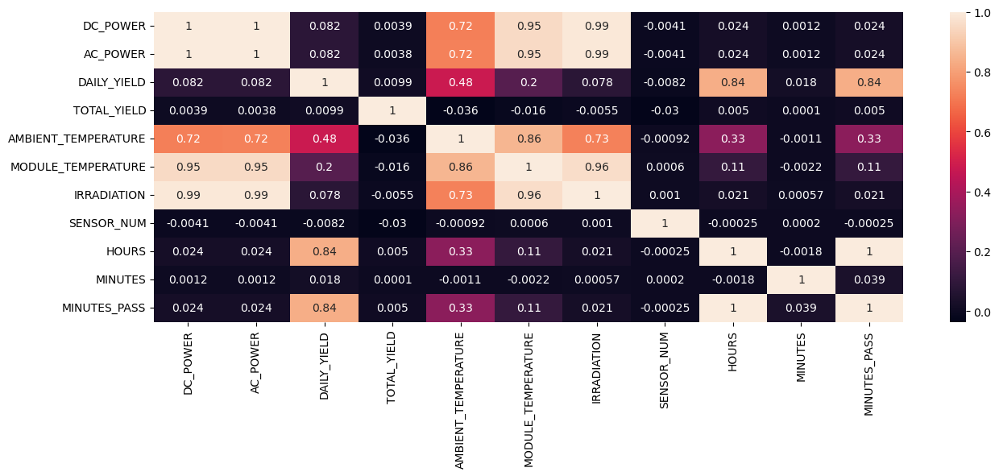

In [24]:
cols_corr = ["DC_POWER", "AC_POWER", "DAILY_YIELD", "TOTAL_YIELD", "AMBIENT_TEMPERATURE", "MODULE_TEMPERATURE", "IRRADIATION", "SENSOR_NUM", "HOURS", "MINUTES", "MINUTES_PASS"]
corrMatrix = df_solar1[cols_corr].corr()
plt.figure(figsize=(15,5))
fig_corr = sns.heatmap(corrMatrix, annot=True)
plt.show()

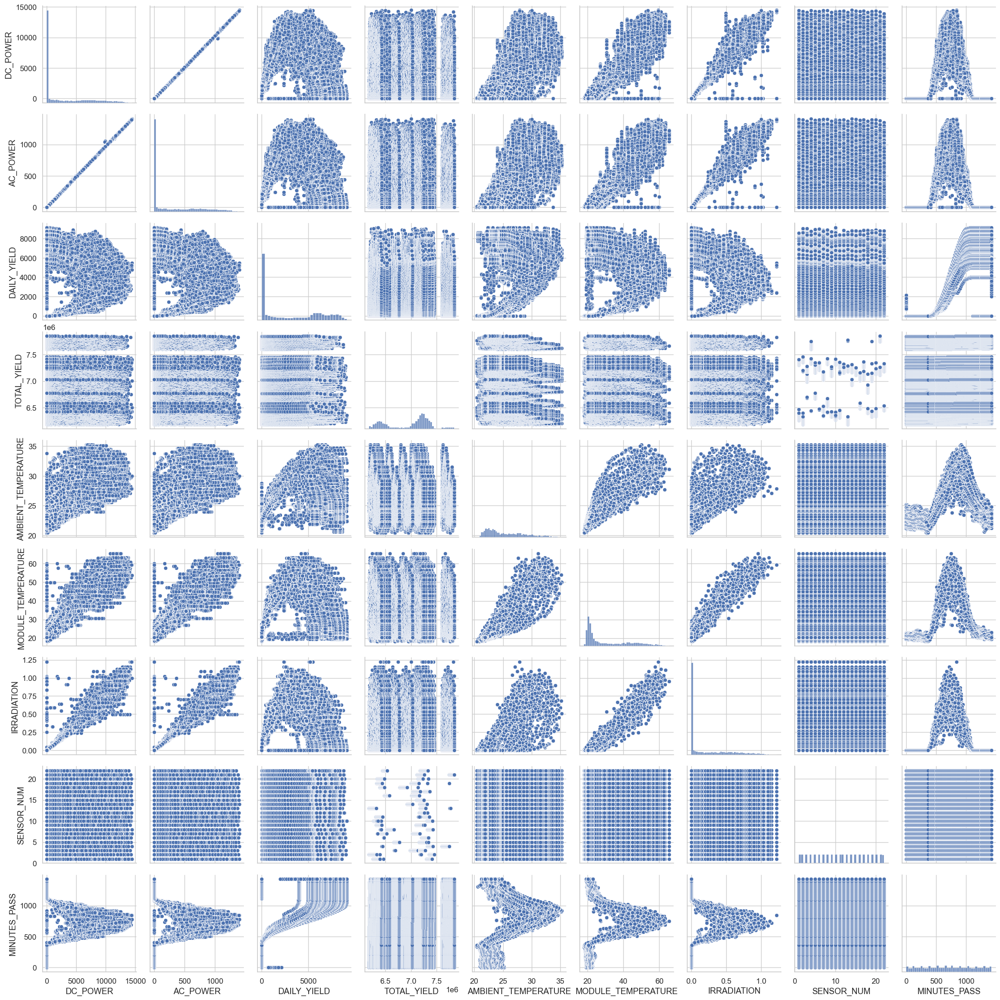

In [25]:
# verilerin birbiriyle alakası grafikleri
sns.set(style='whitegrid', font_scale=1.1, rc={"figure.figsize": [15, 5]})
cols_pair = ["DC_POWER", "AC_POWER", "DAILY_YIELD", "TOTAL_YIELD", "AMBIENT_TEMPERATURE", "MODULE_TEMPERATURE", "IRRADIATION", "SENSOR_NUM", "MINUTES_PASS"]
fig_pair = sns.pairplot(df_solar1[cols_pair])
plt.show()

In [26]:
fig = px.scatter(df_solar1, x="TIME", y="DC_POWER", title="DC Power: Daily Distribution", color = "DATE_STR")
fig.update_traces(marker=dict(size=5, opacity=0.7), selector=dict(mode='markers'))
fig.show()

In [27]:
fig = px.scatter(df_solar1, x="TIME", y="AC_POWER", title="AC Power: Daily Distribution", color = "DATE_STR")
fig.update_traces(marker=dict(size=5, opacity=0.7), selector=dict(mode='markers'))
fig.show()

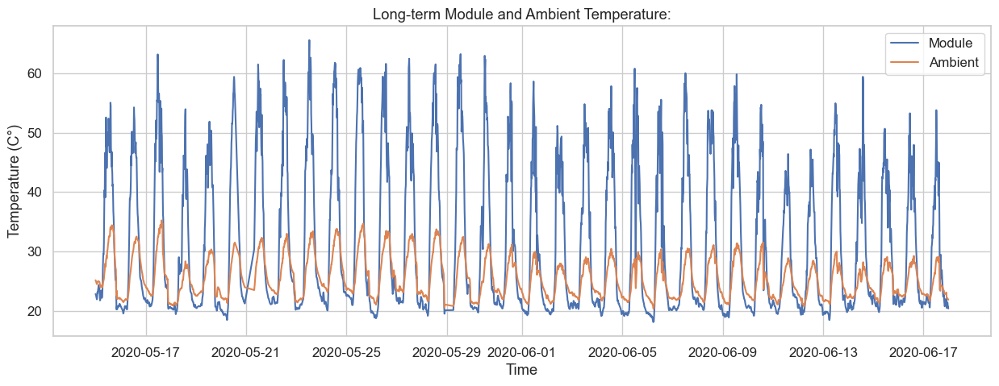

In [28]:
plt.plot(df_solar1.DATE_TIME, df_solar1.MODULE_TEMPERATURE, label="Module")
plt.plot(df_solar1.DATE_TIME, df_solar1.AMBIENT_TEMPERATURE, label="Ambient")
plt.title("Long-term Module and Ambient Temperature:")
plt.legend()
plt.xlabel("Time")
plt.ylabel("Temperature (C°)")
plt.show()

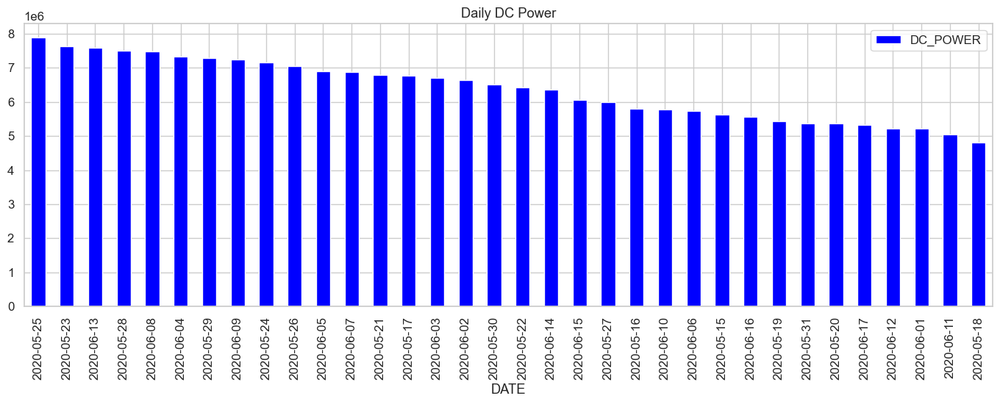

In [29]:
daily_dc = df_solar1.groupby('DATE')['DC_POWER'].agg('sum')

ax = daily_dc.sort_values(ascending=False).plot.bar(figsize=(17,5), legend=True,color='blue')
plt.title('Daily DC Power')
plt.show()

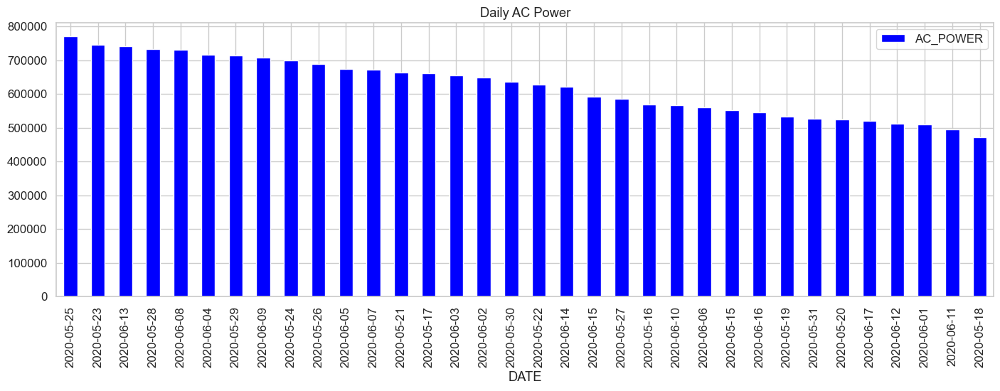

In [30]:
daily_dc = df_solar1.groupby('DATE')['AC_POWER'].agg('sum')

ax = daily_dc.sort_values(ascending=False).plot.bar(figsize=(17,5), legend=True,color='blue')
plt.title('Daily AC Power')
plt.show()

### efficiency hesabı yapalım

In [31]:
solar_dc_power = df_solar1[df_solar1['DC_POWER'] > 0]['DC_POWER'].values
solar_ac_power = df_solar1[df_solar1['AC_POWER'] > 0]['AC_POWER'].values

eff = (np.max(solar_ac_power)/np.max(solar_dc_power ))*100
print(f"Power ratio AC/DC (Efficiency) of Solar Power Plant:  {eff:0.3f} %")

Power ratio AC/DC (Efficiency) of Solar Power Plant:  9.750 %


Text(0.5, 1.0, ' power generated vs efficiency')

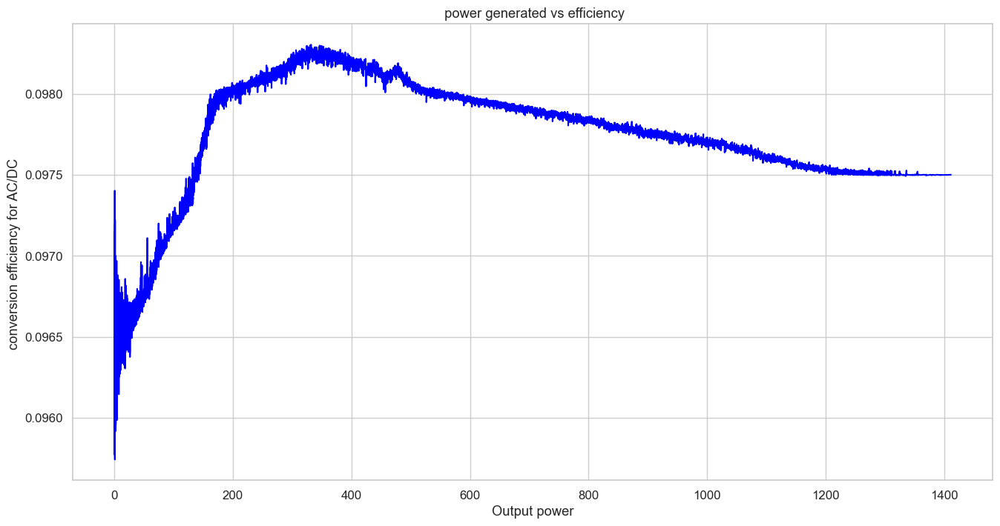

In [32]:
AC=[]
for i in df_solar1['AC_POWER']:
    if i>0:
        AC.append(i)

     

DC=[]

for i in df_solar1['DC_POWER']:
    if i>0:
        DC.append(i)
DC
DC.sort()
DC.reverse()
     

plt.figure(figsize=(16,8))
AC.sort()
DC.sort()

eff_values = [i/j for i,j in zip(AC,DC)]

plt.plot(AC,eff_values,color='blue')
plt.xlabel('Output power')
plt.ylabel('conversion efficiency for AC/DC ')
plt.title(' power generated vs efficiency')

In [33]:
df_solar2 = pd.merge(generation_data_plant2.drop(columns = ['PLANT_ID']), weather_data_plant2.drop(columns = ['PLANT_ID', 'SOURCE_KEY']), on='DATE_TIME')

# bütün datasetleri birleştirip toparlayalım
df_all_plants = pd.concat([df_solar1, df_solar2])

In [34]:
df_all_plants

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.000000,1.0,1,2020-05-15,00:00:00,0.0,0.0,0.0,2020-05-15
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.000000,2.0,2,2020-05-15,00:00:00,0.0,0.0,0.0,2020-05-15
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.000000,3.0,3,2020-05-15,00:00:00,0.0,0.0,0.0,2020-05-15
3,2020-05-15 00:00:00,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.000000,4.0,4,2020-05-15,00:00:00,0.0,0.0,0.0,2020-05-15
4,2020-05-15 00:00:00,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,25.184316,22.857507,0.000000,5.0,5,2020-05-15,00:00:00,0.0,0.0,0.0,2020-05-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67689,2020-06-17 11:30:00,q49J1IKaHRwDQnt,0.0,0.0,4157.0,520758.0,29.746191,34.781946,0.244607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67690,2020-06-17 11:30:00,rrq4fwE8jgrTyWY,0.0,0.0,3931.0,121131356.0,29.746191,34.781946,0.244607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67691,2020-06-17 11:30:00,vOuJvMaM2sgwLmb,0.0,0.0,4322.0,2427691.0,29.746191,34.781946,0.244607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67692,2020-06-17 11:30:00,xMbIugepa2P7lBB,0.0,0.0,4218.0,106896394.0,29.746191,34.781946,0.244607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### işi hatalı yaptım bi baştan düzgünce merge edelim zaten data analizi yapıldı veride bi sakatlık da yok

In [35]:
generation_data = pd.read_csv('Plant_1_Generation_Data.csv')
weather_data = pd.read_csv('Plant_1_Weather_Sensor_Data.csv')
generation_data2 = pd.read_csv('Plant_2_Generation_Data.csv')
weather_data2 = pd.read_csv('Plant_2_Weather_Sensor_Data.csv')

In [36]:
generation_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68778 entries, 0 to 68777
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_TIME    68778 non-null  object 
 1   PLANT_ID     68778 non-null  int64  
 2   SOURCE_KEY   68778 non-null  object 
 3   DC_POWER     68778 non-null  float64
 4   AC_POWER     68778 non-null  float64
 5   DAILY_YIELD  68778 non-null  float64
 6   TOTAL_YIELD  68778 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.7+ MB


In [37]:
generation_data.describe().T

,count,mean,std,min,25%,50%,75%,max
PLANT_ID,68778.0,4.135001e+06,0.000000,4135001.0,4.135001e+06,4.135001e+06,4.135001e+06,4135001.000
DC_POWER,68778.0,3.147426e+03,4036.457169,0.0,0.000000e+00,4.290000e+02,6.366964e+03,14471.125
AC_POWER,68778.0,3.078028e+02,394.396439,0.0,0.000000e+00,4.149375e+01,6.236187e+02,1410.950
DAILY_YIELD,68778.0,3.295969e+03,3145.178309,0.0,0.000000e+00,2.658714e+03,6.274000e+03,9163.000
TOTAL_YIELD,68778.0,6.978712e+06,416271.982856,6183645.0,6.512003e+06,7.146685e+06,7.268706e+06,7846821.000


In [38]:
generation_data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_TIME    67698 non-null  object 
 1   PLANT_ID     67698 non-null  int64  
 2   SOURCE_KEY   67698 non-null  object 
 3   DC_POWER     67698 non-null  float64
 4   AC_POWER     67698 non-null  float64
 5   DAILY_YIELD  67698 non-null  float64
 6   TOTAL_YIELD  67698 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.6+ MB


In [39]:
generation_data['SOURCE_KEY'] = generation_data['SOURCE_KEY'].astype(str)
generation_data2['SOURCE_KEY'] = generation_data2['SOURCE_KEY'].astype(str)

weather_data['SOURCE_KEY'] = weather_data['SOURCE_KEY'].astype(str)
weather_data2['SOURCE_KEY'] = weather_data2['SOURCE_KEY'].astype(str)

generation_data['DATE'] = pd.to_datetime(generation_data['DATE_TIME']).dt.date
generation_data['TIME'] = pd.to_datetime(generation_data['DATE_TIME']).dt.time
weather_data['DATE'] = pd.to_datetime(weather_data['DATE_TIME']).dt.date
weather_data['TIME'] = pd.to_datetime(weather_data['DATE_TIME']).dt.time
generation_data2['DATE'] = pd.to_datetime(generation_data2['DATE_TIME']).dt.date
generation_data2['TIME'] = pd.to_datetime(generation_data2['DATE_TIME']).dt.time
weather_data2['DATE'] = pd.to_datetime(weather_data2['DATE_TIME']).dt.date
weather_data2['TIME'] = pd.to_datetime(weather_data2['DATE_TIME']).dt.time

generation_data = generation_data.drop(['DATE_TIME'],axis=1)
weather_data = weather_data.drop(['DATE_TIME'],axis=1)
generation_data2 = generation_data2.drop(['DATE_TIME'],axis=1)
weather_data2 = weather_data2.drop(['DATE_TIME'],axis=1)

df1 = pd.merge(generation_data, weather_data.drop(columns=['PLANT_ID', 'SOURCE_KEY']), on=['DATE', 'TIME'])
df2 = pd.merge(generation_data2, weather_data2.drop(columns=['PLANT_ID', 'SOURCE_KEY']), on=['DATE', 'TIME'])

In [40]:
df1

,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,DATE,TIME,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,4135001,1BY6WEcLGh8j5v7,0.0,0.0,0.000,6259559.0,2020-05-15,00:00:00,25.184316,22.857507,0.0
1,4135001,1IF53ai7Xc0U56Y,0.0,0.0,0.000,6183645.0,2020-05-15,00:00:00,25.184316,22.857507,0.0
2,4135001,3PZuoBAID5Wc2HD,0.0,0.0,0.000,6987759.0,2020-05-15,00:00:00,25.184316,22.857507,0.0
3,4135001,7JYdWkrLSPkdwr4,0.0,0.0,0.000,7602960.0,2020-05-15,00:00:00,25.184316,22.857507,0.0
4,4135001,McdE0feGgRqW7Ca,0.0,0.0,0.000,7158964.0,2020-05-15,00:00:00,25.184316,22.857507,0.0
...,...,...,...,...,...,...,...,...,...,...,...
68769,4135001,uHbuxQJl8lW7ozc,0.0,0.0,5967.000,7287002.0,2020-06-17,23:45:00,21.909288,20.427972,0.0
68770,4135001,wCURE6d3bPkepu2,0.0,0.0,5147.625,7028601.0,2020-06-17,23:45:00,21.909288,20.427972,0.0
68771,4135001,z9Y9gH1T5YWrNuG,0.0,0.0,5819.000,7251204.0,2020-06-17,23:45:00,21.909288,20.427972,0.0
68772,4135001,zBIq5rxdHJRwDNY,0.0,0.0,5817.000,6583369.0,2020-06-17,23:45:00,21.909288,20.427972,0.0


In [41]:
df2

,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,DATE,TIME,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,4136001,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06,2020-05-15,00:00:00,27.004764,25.060789,0.0
1,4136001,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09,2020-05-15,00:00:00,27.004764,25.060789,0.0
2,4136001,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09,2020-05-15,00:00:00,27.004764,25.060789,0.0
3,4136001,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06,2020-05-15,00:00:00,27.004764,25.060789,0.0
4,4136001,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07,2020-05-15,00:00:00,27.004764,25.060789,0.0
...,...,...,...,...,...,...,...,...,...,...,...
67693,4136001,q49J1IKaHRwDQnt,0.0,0.0,4157.000000,5.207580e+05,2020-06-17,23:45:00,23.202871,22.535908,0.0
67694,4136001,rrq4fwE8jgrTyWY,0.0,0.0,3931.000000,1.211314e+08,2020-06-17,23:45:00,23.202871,22.535908,0.0
67695,4136001,vOuJvMaM2sgwLmb,0.0,0.0,4322.000000,2.427691e+06,2020-06-17,23:45:00,23.202871,22.535908,0.0
67696,4136001,xMbIugepa2P7lBB,0.0,0.0,4218.000000,1.068964e+08,2020-06-17,23:45:00,23.202871,22.535908,0.0


In [42]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68774 entries, 0 to 68773
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   PLANT_ID             68774 non-null  int64  
 1   SOURCE_KEY           68774 non-null  object 
 2   DC_POWER             68774 non-null  float64
 3   AC_POWER             68774 non-null  float64
 4   DAILY_YIELD          68774 non-null  float64
 5   TOTAL_YIELD          68774 non-null  float64
 6   DATE                 68774 non-null  object 
 7   TIME                 68774 non-null  object 
 8   AMBIENT_TEMPERATURE  68774 non-null  float64
 9   MODULE_TEMPERATURE   68774 non-null  float64
 10  IRRADIATION          68774 non-null  float64
dtypes: float64(7), int64(1), object(3)
memory usage: 5.8+ MB


In [43]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   PLANT_ID             67698 non-null  int64  
 1   SOURCE_KEY           67698 non-null  object 
 2   DC_POWER             67698 non-null  float64
 3   AC_POWER             67698 non-null  float64
 4   DAILY_YIELD          67698 non-null  float64
 5   TOTAL_YIELD          67698 non-null  float64
 6   DATE                 67698 non-null  object 
 7   TIME                 67698 non-null  object 
 8   AMBIENT_TEMPERATURE  67698 non-null  float64
 9   MODULE_TEMPERATURE   67698 non-null  float64
 10  IRRADIATION          67698 non-null  float64
dtypes: float64(7), int64(1), object(3)
memory usage: 5.7+ MB


##### iki dataframe i mergeleyelim

In [44]:
df = pd.concat([df1, df2])
df

,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,DATE,TIME,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,4135001,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,2020-05-15,00:00:00,25.184316,22.857507,0.0
1,4135001,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,2020-05-15,00:00:00,25.184316,22.857507,0.0
2,4135001,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,2020-05-15,00:00:00,25.184316,22.857507,0.0
3,4135001,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,2020-05-15,00:00:00,25.184316,22.857507,0.0
4,4135001,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,2020-05-15,00:00:00,25.184316,22.857507,0.0
...,...,...,...,...,...,...,...,...,...,...,...
67693,4136001,q49J1IKaHRwDQnt,0.0,0.0,4157.0,520758.0,2020-06-17,23:45:00,23.202871,22.535908,0.0
67694,4136001,rrq4fwE8jgrTyWY,0.0,0.0,3931.0,121131356.0,2020-06-17,23:45:00,23.202871,22.535908,0.0
67695,4136001,vOuJvMaM2sgwLmb,0.0,0.0,4322.0,2427691.0,2020-06-17,23:45:00,23.202871,22.535908,0.0
67696,4136001,xMbIugepa2P7lBB,0.0,0.0,4218.0,106896394.0,2020-06-17,23:45:00,23.202871,22.535908,0.0


In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 136472 entries, 0 to 67697
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   PLANT_ID             136472 non-null  int64  
 1   SOURCE_KEY           136472 non-null  object 
 2   DC_POWER             136472 non-null  float64
 3   AC_POWER             136472 non-null  float64
 4   DAILY_YIELD          136472 non-null  float64
 5   TOTAL_YIELD          136472 non-null  float64
 6   DATE                 136472 non-null  object 
 7   TIME                 136472 non-null  object 
 8   AMBIENT_TEMPERATURE  136472 non-null  float64
 9   MODULE_TEMPERATURE   136472 non-null  float64
 10  IRRADIATION          136472 non-null  float64
dtypes: float64(7), int64(1), object(3)
memory usage: 12.5+ MB


In [46]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
PLANT_ID,136472.0,4.135497e+06,4.999863e+02,4.135001e+06,4.135001e+06,4.135001e+06,4.136001e+06,4.136001e+06
DC_POWER,136472.0,1.708374e+03,3.222079e+03,0.000000e+00,0.000000e+00,5.993333e+00,1.155595e+03,1.447112e+04
AC_POWER,136472.0,2.747903e+02,3.801802e+02,0.000000e+00,0.000000e+00,3.493095e+00,5.325686e+02,1.410950e+03
DAILY_YIELD,136472.0,3.295366e+03,3.035313e+03,0.000000e+00,2.828571e+01,2.834643e+03,5.992000e+03,9.873000e+03
TOTAL_YIELD,136472.0,3.303916e+08,6.085769e+08,0.000000e+00,6.520020e+06,7.269333e+06,2.826096e+08,2.247916e+09
AMBIENT_TEMPERATURE,136472.0,2.676307e+01,3.897340e+00,2.039850e+01,2.363760e+01,2.590812e+01,2.926658e+01,3.918164e+01
MODULE_TEMPERATURE,136472.0,3.192074e+01,1.180367e+01,1.814042e+01,2.241170e+01,2.641376e+01,4.077858e+01,6.663595e+01
IRRADIATION,136472.0,2.307669e-01,3.056523e-01,0.000000e+00,0.000000e+00,2.621286e-02,4.429609e-01,1.221652e+00


### keyli işler bizi bozar çıkartalım

In [47]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler

label = df['DAILY_YIELD']
forscale = df.drop(['PLANT_ID','SOURCE_KEY','DATE','TIME'],axis = 1)
scaler = StandardScaler()
f_scaled = scaler.fit_transform(forscale)

In [48]:
newf = pd.DataFrame(f_scaled, columns = ['DC_POWER','AC_POWER','DAILY_YIELD','TOTAL_YIELD','AMBIENT_TEMPERATURE','MODULE_TEMPERATURE','IRRADIATION'])

newf.describe().T

,count,mean,std,min,25%,50%,75%,max
DC_POWER,136472.0,4.665032e-17,1.000004,-0.530210,-0.530210,-0.528350,-0.171560,3.961044
AC_POWER,136472.0,2.332516e-17,1.000004,-0.722792,-0.722792,-0.713604,0.678045,2.988488
DAILY_YIELD,136472.0,-1.682744e-16,1.000004,-1.085680,-1.076361,-0.151788,0.888424,2.167044
TOTAL_YIELD,136472.0,-6.664332e-18,1.000004,-0.542894,-0.532180,-0.530949,-0.078515,3.150845
AMBIENT_TEMPERATURE,136472.0,-1.137935e-15,1.000004,-1.633058,-0.801950,-0.219367,0.642368,3.186434
MODULE_TEMPERATURE,136472.0,-1.482814e-16,1.000004,-1.167465,-0.805603,-0.466550,0.750433,2.941062
IRRADIATION,136472.0,-9.996498e-18,1.000004,-0.755001,-0.755001,-0.669240,0.694236,3.241882


In [49]:
newf = pd.DataFrame(f_scaled, columns = ['DC_POWER','AC_POWER','DAILY_YIELD',
                                         'TOTAL_YIELD','AMBIENT_TEMPERATURE',
                                         'MODULE_TEMPERATURE','IRRADIATION'])


In [50]:
newf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136472 entries, 0 to 136471
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   DC_POWER             136472 non-null  float64
 1   AC_POWER             136472 non-null  float64
 2   DAILY_YIELD          136472 non-null  float64
 3   TOTAL_YIELD          136472 non-null  float64
 4   AMBIENT_TEMPERATURE  136472 non-null  float64
 5   MODULE_TEMPERATURE   136472 non-null  float64
 6   IRRADIATION          136472 non-null  float64
dtypes: float64(7)
memory usage: 7.3 MB


In [51]:
newf

,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,-0.53021,-0.722792,-1.085680,-0.532608,-0.405085,-0.767835,-0.755001
1,-0.53021,-0.722792,-1.085680,-0.532733,-0.405085,-0.767835,-0.755001
2,-0.53021,-0.722792,-1.085680,-0.531412,-0.405085,-0.767835,-0.755001
3,-0.53021,-0.722792,-1.085680,-0.530401,-0.405085,-0.767835,-0.755001
4,-0.53021,-0.722792,-1.085680,-0.531131,-0.405085,-0.767835,-0.755001
...,...,...,...,...,...,...,...
136467,-0.53021,-0.722792,0.283871,-0.542038,-0.913497,-0.795081,-0.755001
136468,-0.53021,-0.722792,0.209414,-0.343853,-0.913497,-0.795081,-0.755001
136469,-0.53021,-0.722792,0.338231,-0.538905,-0.913497,-0.795081,-0.755001
136470,-0.53021,-0.722792,0.303968,-0.367244,-0.913497,-0.795081,-0.755001


## lstm mlp modelleri falan denicez modelleri ve kütüphaneleri yükleyelim

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import os

from sklearn.preprocessing import MinMaxScaler

from tensorflow.keras.layers import Input, Dropout, Dense, LSTM, TimeDistributed, RepeatVector, Flatten
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import regularizers
from tensorflow import keras
from keras.callbacks import EarlyStopping

generation1 = pd.read_csv('Plant_1_Generation_Data.csv')
weather1 = pd.read_csv('Plant_1_Weather_Sensor_Data.csv')
generation1['DATE_TIME'] = pd.to_datetime(generation1['DATE_TIME'], dayfirst=True)
weather1['DATE_TIME'] = pd.to_datetime(weather1['DATE_TIME'], dayfirst=True)

# source keyler ile alakalı kontrolleri sağlayalım. sonrasında irradiation üzerinden anomaly var mı bakalım

In [53]:
inverters = list(generation1['SOURCE_KEY'].unique())
print(f"total number of inverters {len(inverters)}")

inv_1 = generation1[generation1['SOURCE_KEY']==inverters[0]]
# Keep only datetime stamps that are common to both weather and inverter dataframes
mask = ((weather1['DATE_TIME'] >= min(inv_1["DATE_TIME"])) & (weather1['DATE_TIME'] <= max(inv_1["DATE_TIME"])))
weather_filtered = weather1.loc[mask]

total number of inverters 22


In [54]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=inv_1["DATE_TIME"], y=inv_1["AC_POWER"],
                    mode='lines',
                    name='AC Power'))

fig.add_trace(go.Scatter(x=weather_filtered["DATE_TIME"], y=weather_filtered["IRRADIATION"],
                    mode='lines',
                    name='Irradiation',
                    yaxis='y2'))

fig.update_layout(title_text="Irradiation vs AC POWER",
                  yaxis1=dict(title="AC Power in kW",
                              side='left'),
                  yaxis2=dict(title="Irradiation index",
                              side='right',
                              anchor="x",
                              overlaying="y"
                             ))

fig.show()

In [55]:
df = inv_1.merge(weather_filtered, on="DATE_TIME", how='left')
df = df[['DATE_TIME', 'DC_POWER', 'AC_POWER', 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE', 'IRRADIATION']]
df

,DATE_TIME,DC_POWER,AC_POWER,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,0.0,0.0,25.184316,22.857507,0.0
1,2020-05-15 00:15:00,0.0,0.0,25.084589,22.761668,0.0
2,2020-05-15 00:30:00,0.0,0.0,24.935753,22.592306,0.0
3,2020-05-15 00:45:00,0.0,0.0,24.846130,22.360852,0.0
4,2020-05-15 01:00:00,0.0,0.0,24.621525,22.165423,0.0
...,...,...,...,...,...,...
3149,2020-06-17 22:45:00,0.0,0.0,22.150570,21.480377,0.0
3150,2020-06-17 23:00:00,0.0,0.0,22.129816,21.389024,0.0
3151,2020-06-17 23:15:00,0.0,0.0,22.008275,20.709211,0.0
3152,2020-06-17 23:30:00,0.0,0.0,21.969495,20.734963,0.0


In [56]:
df = df[["DATE_TIME", "DC_POWER", "AMBIENT_TEMPERATURE", "MODULE_TEMPERATURE", "IRRADIATION"]]
df_timestamp = df[["DATE_TIME"]]
df_ = df[["MODULE_TEMPERATURE", "IRRADIATION", "DC_POWER"]]

train_prp = .6
train = df_.loc[:df_.shape[0]*train_prp]
test = df_.loc[df_.shape[0]*train_prp:]

scaler = MinMaxScaler()
X_train = scaler.fit_transform(train)
X_test = scaler.transform(test)
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")

X_train shape: (1893, 3)
X_test shape: (1261, 3)


In [57]:
# Predict 4 timesteps into the future. Since each timestep is equal to a 15-min interval, we are predicting hourly DC_POWER generation
X = []
Y = []
T = 4

In [58]:
for i in range(T, X_train.shape[0]):
    x = X_train[i-T:i,:]
    X.append(x)
    y = X_train[i,:]
    Y.append(y)
    
X,Y=np.array(X),np.array(Y)
X.shape

(1889, 4, 3)

### lstm modeli uygulayalım

In [59]:
def lstm_model():
    model = Sequential()
    model.add(LSTM(units = 50, return_sequences = True, input_shape = (X.shape[1], X.shape[2])))
    model.add(Dropout(0.2))
    model.add(LSTM(units = 50, return_sequences = True))
    model.add(Dropout(0.2))
    model.add(LSTM(units = 50, return_sequences = True))
    model.add(Dropout(0.2))
    model.add(LSTM(units = 50))
    model.add(Dropout(0.2))
    model.add(Dense(units = X.shape[2]))
    return model

model = lstm_model()
opt = keras.optimizers.Adam(learning_rate=0.0001)
early_stop = EarlyStopping(monitor='val_loss', patience=20)
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 4, 50)             10800     
                                                                 
 dropout (Dropout)           (None, 4, 50)             0         
                                                                 
 lstm_1 (LSTM)               (None, 4, 50)             20200     
                                                                 
 dropout_1 (Dropout)         (None, 4, 50)             0         
                                                                 
 lstm_2 (LSTM)               (None, 4, 50)             20200     
                                                                 
 dropout_2 (Dropout)         (None, 4, 50)             0         
                                                                 
 lstm_3 (LSTM)               (None, 50)                2

In [60]:
epochs = 100
batch = 16
history = model.fit(X, Y, epochs=epochs, batch_size=batch, validation_split=.1, callbacks=[early_stop], verbose=1).history

Epoch 1/100
107/107 [==============================] - 4s 10ms/step - loss: 0.0367 - val_loss: 0.0145
Epoch 2/100
107/107 [==============================] - 0s 3ms/step - loss: 0.0163 - val_loss: 0.0105
Epoch 3/100
107/107 [==============================] - 0s 3ms/step - loss: 0.0142 - val_loss: 0.0103
Epoch 4/100
107/107 [==============================] - 0s 3ms/step - loss: 0.0137 - val_loss: 0.0097
Epoch 5/100
107/107 [==============================] - 0s 3ms/step - loss: 0.0119 - val_loss: 0.0093
Epoch 6/100
107/107 [==============================] - 0s 3ms/step - loss: 0.0112 - val_loss: 0.0084
Epoch 7/100
107/107 [==============================] - 0s 3ms/step - loss: 0.0114 - val_loss: 0.0094
Epoch 8/100
107/107 [==============================] - 0s 3ms/step - loss: 0.0097 - val_loss: 0.0075
Epoch 9/100
107/107 [==============================] - 0s 3ms/step - loss: 0.0092 - val_loss: 0.0079
Epoch 10/100
107/107 [==============================] - 0s 3ms/step - loss: 0.0091 - val_l

In [146]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=[x for x in range(len(history['loss']))], y=history['loss'],
                    mode='lines',
                    name='train loss'))

fig.add_trace(go.Scatter(x=[x for x in range(len(history['val_loss']))], y=history['val_loss'],
                    mode='lines',
                    name='validation loss'))

fig.update_layout(title="LSTM Loss",
                  yaxis=dict(title="Loss"),
                  xaxis=dict(title="Epoch"))

fig.show()

In [62]:
Xt = []
Yt = []
T = 4

for i in range(T, X_test.shape[0]):
    x = X_test[i-T:i,:]
    Xt.append(x)
    y = X_test[i,:]
    Yt.append(y)
    
Xt,Yt=np.array(Xt),np.array(Yt)

In [63]:
X_train.shape

(1893, 3)

In [64]:
X_test.shape

(1261, 3)

In [65]:
test

,MODULE_TEMPERATURE,IRRADIATION,DC_POWER
1893,21.235858,0.0,0.0
1894,21.246926,0.0,0.0
1895,21.202568,0.0,0.0
1896,20.969898,0.0,0.0
1897,20.891598,0.0,0.0
...,...,...,...
3149,21.480377,0.0,0.0
3150,21.389024,0.0,0.0
3151,20.709211,0.0,0.0
3152,20.734963,0.0,0.0


In [66]:
testind = test.iloc[4:]
testind

,MODULE_TEMPERATURE,IRRADIATION,DC_POWER
1897,20.891598,0.0,0.0
1898,20.771162,0.0,0.0
1899,20.624068,0.0,0.0
1900,20.517733,0.0,0.0
1901,20.417283,0.0,0.0
...,...,...,...
3149,21.480377,0.0,0.0
3150,21.389024,0.0,0.0
3151,20.709211,0.0,0.0
3152,20.734963,0.0,0.0


In [67]:
X_pred = model.predict(Xt)
X_pred = scaler.inverse_transform(X_pred)
X_pred = pd.DataFrame(X_pred, columns=train.columns)
X_pred.index = testind.index

40/40 [==============================] - 1s 851us/step


In [68]:
testind.shape

(1257, 3)

In [69]:
X_pred.shape

(1257, 3)

In [70]:
X_pred.describe()

,MODULE_TEMPERATURE,IRRADIATION,DC_POWER
count,1257.000000,1257.000000,1257.000000
mean,30.340366,0.217458,2774.922363
std,11.817317,0.274839,3444.915771
min,18.870762,-0.025557,-301.702240
25%,20.880867,0.006779,114.477112
50%,23.062551,0.012572,205.529404
75%,40.781975,0.450202,5748.737305
max,58.617443,0.909917,11277.919922


In [71]:
scores = X_pred
scores['datetime'] = df_timestamp.loc[1893:]
scores['real DC'] = test[['DC_POWER']]
scores["loss_mae"] = (scores['real DC'] - scores['DC_POWER']).abs()

In [72]:
mean = scores['loss_mae'].mean()
std = scores['loss_mae'].std()
lower_bound = mean - 3 * std
upper_bound = mean + 3 * std
scores['Threshold'] = upper_bound
scores['Anomaly'] = np.where((scores['loss_mae'] < lower_bound) | (scores['loss_mae'] > upper_bound), 1, 0)

In [73]:
scores

,MODULE_TEMPERATURE,IRRADIATION,DC_POWER,datetime,real DC,loss_mae,Threshold,Anomaly
1897,21.011751,0.006585,109.250465,2020-06-04 21:15:00,0.0,109.250465,4083.353547,0
1898,20.945183,0.006294,106.310371,2020-06-04 21:30:00,0.0,106.310371,4083.353547,0
1899,20.857159,0.006329,107.709282,2020-06-04 21:45:00,0.0,107.709282,4083.353547,0
1900,20.752655,0.006521,111.233788,2020-06-04 22:00:00,0.0,111.233788,4083.353547,0
1901,20.668089,0.006501,111.882568,2020-06-04 22:15:00,0.0,111.882568,4083.353547,0
...,...,...,...,...,...,...,...,...
3149,21.030212,0.004583,83.930359,2020-06-17 22:45:00,0.0,83.930359,4083.353547,0
3150,20.908434,0.008540,135.263672,2020-06-17 23:00:00,0.0,135.263672,4083.353547,0
3151,20.971550,0.009373,144.926300,2020-06-17 23:15:00,0.0,144.926300,4083.353547,0
3152,21.028444,0.006225,104.400375,2020-06-17 23:30:00,0.0,104.400375,4083.353547,0


In [74]:
scores.Anomaly.value_counts()

Anomaly
0    1228
1      29
Name: count, dtype: int64

In [75]:
scores[scores['Anomaly'] == 1]

,MODULE_TEMPERATURE,IRRADIATION,DC_POWER,datetime,real DC,loss_mae,Threshold,Anomaly
1948,41.373592,0.424643,5406.303711,2020-06-05 10:00:00,9849.571429,4443.267718,4083.353547,1
1956,57.760933,0.838373,10338.635742,2020-06-05 12:00:00,3983.857143,6354.778599,4083.353547,1
2057,57.285423,0.818736,10120.971680,2020-06-06 13:15:00,5124.000000,4996.971680,4083.353547,1
2061,43.751324,0.506359,6412.996582,2020-06-06 14:15:00,10567.875000,4154.878418,4083.353547,1
2062,53.274677,0.788358,9868.976562,2020-06-06 14:30:00,4632.142857,5236.833706,4083.353547,1
2136,36.012329,0.385580,4979.371094,2020-06-07 09:00:00,9296.714286,4317.343192,4083.353547,1
2149,58.521431,0.877683,10834.494141,2020-06-07 12:15:00,1715.000000,9119.494141,4083.353547,1
2150,50.827209,0.629584,7786.620117,2020-06-07 12:30:00,0.000000,7786.620117,4083.353547,1
2151,53.179001,0.691795,8589.391602,2020-06-07 12:45:00,0.000000,8589.391602,4083.353547,1
2152,52.935406,0.645375,7999.937500,2020-06-07 13:00:00,0.000000,7999.937500,4083.353547,1


In [76]:
fig = go.Figure(data=[go.Histogram(x=scores['loss_mae'])])
fig.update_layout(title="Error distribution",
                 xaxis=dict(title="Error delta between predicted and real data [DC Power]"),
                 yaxis=dict(title="Data point counts"))
fig.show()

In [77]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=scores['datetime'],
                         y=scores['loss_mae'],
                         name="Loss"))
fig.add_trace(go.Scatter(x=scores['datetime'],
                         y=scores['Threshold'],
                         name="Threshold"))

fig.update_layout(title="Error Timeseries and Threshold",
                 xaxis=dict(title="DateTime"),
                 yaxis=dict(title="Loss"))
fig.show()

In [78]:
anomalies = scores[scores['Anomaly'] == 1][['real DC']]
anomalies = anomalies.rename(columns={'real DC':'anomalies'})
scores = scores.merge(anomalies, left_index=True, right_index=True, how='left')

fig = go.Figure()

fig.add_trace(go.Scatter(x=scores["datetime"], y=scores["real DC"],
                    mode='lines',
                    name='DC Power'))

fig.add_trace(go.Scatter(x=scores["datetime"], y=scores["anomalies"],
                    name='Anomaly',
                    mode='markers',
                    marker=dict(color="red",
                                size=11,
                                line=dict(color="red",
                                          width=2))))

fig.update_layout(title_text="Anomalies Detected LSTM")

fig.show()

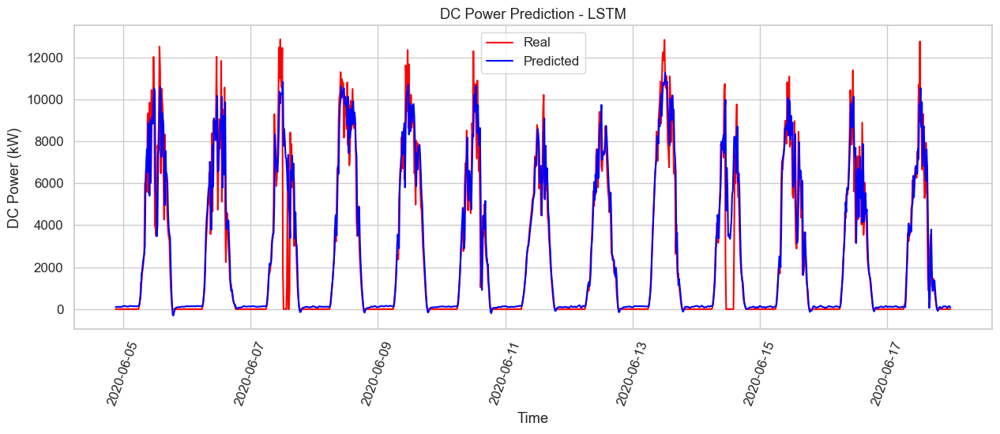

In [79]:
plt.plot(scores['datetime'],scores['real DC'], color = 'red', label = 'Real')
plt.plot(scores['datetime'],scores['DC_POWER'], color = 'blue', label = 'Predicted')
plt.title('DC Power Prediction - LSTM')
plt.xticks(rotation=70)
plt.xlabel('Time')
plt.ylabel('DC Power (kW)')
plt.legend()
plt.show()

## MLP + LSTM Autoencoder işi yapalım. Bu sefer 15 dkda bir inceleme

In [80]:
X = []
Y = []
T = 1

for i in range(T, X_train.shape[0]):
    x = X_train[i-T:i,:]
    X.append(x)
    y = X_train[i,:]
    Y.append(y)
    
X,Y=np.array(X),np.array(Y)
X.shape

(1892, 1, 3)

In [81]:
def autoencoder_model():
    model = Sequential()

    # Encoder
    model.add(LSTM(units = 16, return_sequences = True, kernel_regularizer=regularizers.l2(0.00), input_shape = (X.shape[1], X.shape[2])))
    model.add(Dropout(0.2))
    model.add(LSTM(units = 4, return_sequences = True))
    model.add(Dropout(0.2))
    model.add(LSTM(units = 1))
    model.add(Dropout(0.2))
    model.add(RepeatVector(X.shape[1]))

    # Decoder
    model.add(LSTM(units = 4, return_sequences = True))
    model.add(Dropout(0.2))
    model.add(LSTM(units = 8, return_sequences = True))
    model.add(Dropout(0.2))
    model.add(LSTM(units = 16, return_sequences = True))
    model.add(Dropout(0.2))
    model.add(TimeDistributed(Dense(units = X.shape[2])))
    return model


model = autoencoder_model()
early_stop = EarlyStopping(monitor='val_loss', patience=20)
opt = keras.optimizers.Adam(learning_rate=0.0003)
model.compile(optimizer=opt, loss='mse')
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 1, 16)             1280      
                                                                 
 dropout_4 (Dropout)         (None, 1, 16)             0         
                                                                 
 lstm_5 (LSTM)               (None, 1, 4)              336       
                                                                 
 dropout_5 (Dropout)         (None, 1, 4)              0         
                                                                 
 lstm_6 (LSTM)               (None, 1)                 24        
                                                                 
 dropout_6 (Dropout)         (None, 1)                 0         
                                                                 
 repeat_vector (RepeatVecto  (None, 1, 1)             

In [82]:
epochs = 100
batch = 8
history = model.fit(X, Y, epochs=epochs,
                    batch_size=batch, validation_split=0.15, callbacks=[early_stop], verbose=1).history

Epoch 1/100
201/201 [==============================] - 5s 6ms/step - loss: 0.1166 - val_loss: 0.0820
Epoch 2/100
201/201 [==============================] - 0s 1ms/step - loss: 0.0845 - val_loss: 0.0715
Epoch 3/100
201/201 [==============================] - 0s 1ms/step - loss: 0.0805 - val_loss: 0.0716
Epoch 4/100
201/201 [==============================] - 0s 1ms/step - loss: 0.0802 - val_loss: 0.0715
Epoch 5/100
201/201 [==============================] - 0s 1ms/step - loss: 0.0801 - val_loss: 0.0715
Epoch 6/100
201/201 [==============================] - 0s 1ms/step - loss: 0.0801 - val_loss: 0.0714
Epoch 7/100
201/201 [==============================] - 0s 1ms/step - loss: 0.0800 - val_loss: 0.0715
Epoch 8/100
201/201 [==============================] - 0s 1ms/step - loss: 0.0798 - val_loss: 0.0712
Epoch 9/100
201/201 [==============================] - 0s 1ms/step - loss: 0.0798 - val_loss: 0.0710
Epoch 10/100
201/201 [==============================] - 0s 1ms/step - loss: 0.0798 - val_lo

In [83]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=[x for x in range(len(history['loss']))], y=history['loss'],
                    mode='lines',
                    name='train loss'))

fig.add_trace(go.Scatter(x=[x for x in range(len(history['val_loss']))], y=history['val_loss'],
                    mode='lines',
                    name='validation loss'))

fig.update_layout(title="LSTM Autoencoder Loss",
                  yaxis=dict(title="Loss"),
                  xaxis=dict(title="Epoch"))

fig.show()

In [84]:
# Get only the LSTM encoder
encoder = Model(inputs=model.inputs, outputs=model.layers[4].output)
train_encoded = encoder.predict(X)

60/60 [==============================] - 0s 439us/step


In [85]:
train_encoded.shape

(1892, 1)

In [86]:
# Drop first row of train data
train1 = train.iloc[1:]
# Add encoded train data to the train dataframe
train1['encoded'] = train_encoded

In [87]:
train.shape

(1893, 3)

In [88]:
train1.shape

(1892, 4)

In [89]:
X_train.shape

(1893, 3)

In [90]:
train1

,MODULE_TEMPERATURE,IRRADIATION,DC_POWER,encoded
1,22.761668,0.0,0.0,0.170574
2,22.592306,0.0,0.0,0.170639
3,22.360852,0.0,0.0,0.170752
4,22.165423,0.0,0.0,0.170906
5,21.968571,0.0,0.0,0.171034
...,...,...,...,...
1888,22.163503,0.0,0.0,0.170592
1889,21.731079,0.0,0.0,0.171035
1890,21.650517,0.0,0.0,0.171313
1891,21.817371,0.0,0.0,0.171364


In [91]:
train_encoded.shape

(1892, 1)

In [92]:
# Set target variable
Y1 = train1[['DC_POWER']]
# Set features for model training
X1 = train1[['MODULE_TEMPERATURE', 'IRRADIATION', 'encoded']]

X1.shape

(1892, 3)

In [93]:
def mlp_model():
    model = Sequential()
    model.add(Dense(512, kernel_initializer='he_uniform', activation='relu', input_shape=(X1.shape[1],)))
    model.add(Dense(256, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dense(128, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dense(64, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dense(32, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dense(1))
    return model


model = mlp_model()
opt = keras.optimizers.Adam(learning_rate=0.0001)
early_stop = EarlyStopping(monitor='val_loss', patience=20)
model.compile(optimizer=opt, loss='mae')
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 512)               2048      
                                                                 
 dense_3 (Dense)             (None, 256)               131328    
                                                                 
 dense_4 (Dense)             (None, 128)               32896     
                                                                 
 dense_5 (Dense)             (None, 64)                8256      
                                                                 
 dense_6 (Dense)             (None, 32)                2080      
                                                                 
 dense_7 (Dense)             (None, 1)                 33        
                                                                 
Total params: 176641 (690.00 KB)
Trainable params: 176

In [94]:
epochs = 200
batch = 32
history = model.fit(X1, Y1, epochs=epochs, batch_size=batch, validation_split=.1, callbacks=[early_stop], verbose=1).history

Epoch 1/200
54/54 [==============================] - 0s 2ms/step - loss: 2984.5833 - val_loss: 2997.7856
Epoch 2/200
54/54 [==============================] - 0s 1ms/step - loss: 2769.0049 - val_loss: 2728.4363
Epoch 3/200
54/54 [==============================] - 0s 1ms/step - loss: 2439.1860 - val_loss: 2420.9565
Epoch 4/200
54/54 [==============================] - 0s 1ms/step - loss: 2347.1079 - val_loss: 2398.0300
Epoch 5/200
54/54 [==============================] - 0s 1ms/step - loss: 2343.8655 - val_loss: 2378.8496
Epoch 6/200
54/54 [==============================] - 0s 1ms/step - loss: 2339.7188 - val_loss: 2388.9504
Epoch 7/200
54/54 [==============================] - 0s 1ms/step - loss: 2338.6863 - val_loss: 2390.1641
Epoch 8/200
54/54 [==============================] - 0s 1ms/step - loss: 2335.4360 - val_loss: 2376.9124
Epoch 9/200
54/54 [==============================] - 0s 1ms/step - loss: 2338.8262 - val_loss: 2377.2683
Epoch 10/200
54/54 [==============================] - 0

54/54 [==============================] - 0s 1ms/step - loss: 477.7058 - val_loss: 401.0844
Epoch 80/200
54/54 [==============================] - 0s 1ms/step - loss: 470.1486 - val_loss: 435.0632
Epoch 81/200
54/54 [==============================] - 0s 1ms/step - loss: 464.9176 - val_loss: 395.6189
Epoch 82/200
54/54 [==============================] - 0s 1ms/step - loss: 473.5658 - val_loss: 391.7872
Epoch 83/200
54/54 [==============================] - 0s 1ms/step - loss: 460.2893 - val_loss: 411.6502
Epoch 84/200
54/54 [==============================] - 0s 1ms/step - loss: 462.4595 - val_loss: 405.3634
Epoch 85/200
54/54 [==============================] - 0s 1ms/step - loss: 468.2162 - val_loss: 449.8588
Epoch 86/200
54/54 [==============================] - 0s 1ms/step - loss: 457.5129 - val_loss: 415.9195
Epoch 87/200
54/54 [==============================] - 0s 1ms/step - loss: 458.1292 - val_loss: 420.5910
Epoch 88/200
54/54 [==============================] - 0s 1ms/step - loss: 457

In [95]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=[x for x in range(len(history['loss']))], y=history['loss'],
                    mode='lines',
                    name='train loss'))

fig.add_trace(go.Scatter(x=[x for x in range(len(history['val_loss']))], y=history['val_loss'],
                    mode='lines',
                    name='validation loss'))

fig.update_layout(title="MLP with LSTM Encoder Loss",
                  yaxis=dict(title="Loss"),
                  xaxis=dict(title="Epoch"))

fig.show()

In [96]:
train_preds = model.predict(X1)

60/60 [==============================] - 0s 409us/step


In [97]:
train_preds = pd.DataFrame(train_preds)

In [98]:
train_preds

,0
0,-11.619037
1,-13.747668
2,-16.671068
3,-19.170671
4,-21.674364
...,...
1887,-19.021685
1888,-24.610186
1889,-25.758928
1890,-23.724932


In [99]:
train1['train_preds'] = train_preds

In [100]:
train1

,MODULE_TEMPERATURE,IRRADIATION,DC_POWER,encoded,train_preds
1,22.761668,0.0,0.0,0.170574,-13.747668
2,22.592306,0.0,0.0,0.170639,-16.671068
3,22.360852,0.0,0.0,0.170752,-19.170671
4,22.165423,0.0,0.0,0.170906,-21.674364
5,21.968571,0.0,0.0,0.171034,-16.994066
...,...,...,...,...,...
1888,22.163503,0.0,0.0,0.170592,-24.610186
1889,21.731079,0.0,0.0,0.171035,-25.758928
1890,21.650517,0.0,0.0,0.171313,-23.724932
1891,21.817371,0.0,0.0,0.171364,-26.721361


In [101]:
train1.describe().T

,count,mean,std,min,25%,50%,75%,max
MODULE_TEMPERATURE,1892.0,32.222603,12.921477,18.492340,21.356274,25.528864,43.468281,65.545714
IRRADIATION,1892.0,0.241510,0.310918,0.000000,0.000000,0.036339,0.478535,1.151102
DC_POWER,1892.0,3067.929445,3907.282246,0.000000,0.000000,463.475000,6197.308036,13335.142860
encoded,1892.0,-0.036463,0.276729,-0.556496,-0.340909,0.164461,0.171481,0.173170
train_preds,1891.0,3048.067383,3940.304443,-65.701370,-28.280581,334.382141,6500.156250,13099.287109


In [102]:
Xtt = []
Ytt = []
T = 1

for i in range(T, X_test.shape[0]):
    x = X_test[i-T:i,:]
    Xtt.append(x)
    y = X_test[i,:]
    Ytt.append(y)
    
Xtt,Ytt=np.array(Xtt),np.array(Ytt)
Xtt.shape

(1260, 1, 3)

In [103]:
test_encoded = encoder.predict(Xtt)

40/40 [==============================] - 0s 396us/step


In [104]:
# Drop first row of test data
test1 = test.iloc[1:]
# Add encoded test data to test dataframe
test1['encoded'] = test_encoded

In [105]:
test1.shape

(1260, 4)

In [106]:
test_encoded.shape

(1260, 1)

In [107]:
X_test.shape

(1261, 3)

In [108]:
# Set target variable
Y2 = test1[['DC_POWER']]
# Set features for model prediction
X2 = test1[['MODULE_TEMPERATURE', 'IRRADIATION', 'encoded']]

In [109]:
test_preds = model.predict(X2)

40/40 [==============================] - 0s 378us/step


In [110]:
# Add the predictions to the test dataframe
test1['test_preds'] = test_preds

test1.describe()

,MODULE_TEMPERATURE,IRRADIATION,DC_POWER,encoded,test_preds
count,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000
mean,29.636087,0.213857,2586.661481,-0.005328,2584.363037
std,11.066219,0.285984,3513.470837,0.252992,3533.451660
min,18.140415,0.000000,0.000000,-0.551966,-70.222855
25%,20.840490,0.000000,0.000000,-0.224655,-35.146885
50%,23.130767,0.015325,60.857143,0.168888,29.438719
75%,38.815374,0.424359,5203.142857,0.171812,5401.591675
max,60.757050,1.221652,12864.285710,0.173351,12751.710938


In [111]:
scores = test1
scores['datetime'] = df_timestamp.loc[630:]
scores['real DC'] = test1['DC_POWER']
scores["loss_mae"] = (scores['real DC'] - scores['test_preds']).abs()

In [112]:
# Three sigma way
mean = scores['loss_mae'].mean()
std = scores['loss_mae'].std()
lower_bound = mean - 3 * std
upper_bound = mean + 3 * std
scores['Threshold'] = upper_bound
scores['Anomaly'] = np.where((scores['loss_mae'] < lower_bound) | (scores['loss_mae'] > upper_bound), 1, 0)

In [113]:
scores.describe()

,MODULE_TEMPERATURE,IRRADIATION,DC_POWER,encoded,test_preds,datetime,real DC,loss_mae,Threshold,Anomaly
count,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260,1260.000000,1260.000000,1.260000e+03,1260.000000
mean,29.636087,0.213857,2586.661481,-0.005328,2584.363037,2020-06-11 09:54:08.571428608,2586.661481,480.188165,3.992774e+03,0.018254
min,18.140415,0.000000,0.000000,-0.551966,-70.222855,2020-06-04 20:30:00,0.000000,0.555926,3.992774e+03,0.000000
25%,20.840490,0.000000,0.000000,-0.224655,-35.146885,2020-06-08 03:11:15,0.000000,34.398615,3.992774e+03,0.000000
50%,23.130767,0.015325,60.857143,0.168888,29.438719,2020-06-11 09:52:30,60.857143,56.312351,3.992774e+03,0.000000
75%,38.815374,0.424359,5203.142857,0.171812,5401.591675,2020-06-14 16:33:45,5203.142857,607.349834,3.992774e+03,0.000000
max,60.757050,1.221652,12864.285710,0.173351,12751.710938,2020-06-17 23:45:00,12864.285710,12751.710938,3.992774e+03,1.000000
std,11.066219,0.285984,3513.470837,0.252992,3533.451660,NaN,3513.470837,1170.861981,2.729567e-12,0.133922


In [114]:
fig = go.Figure(data=[go.Histogram(x=scores['loss_mae'])])
fig.update_layout(title="Error distribution",
                 xaxis=dict(title="Error delta between predicted and real data [DC Power]"),
                 yaxis=dict(title="Data point counts"))
fig.show()

In [115]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=scores['datetime'],
                         y=scores['loss_mae'],
                         name="Loss"))
fig.add_trace(go.Scatter(x=scores['datetime'],
                         y=scores['Threshold'],
                         name="Threshold"))

fig.update_layout(title="Error Timeseries and Threshold",
                 xaxis=dict(title="DateTime"),
                 yaxis=dict(title="Loss"))
fig.show()

In [116]:
scores['Anomaly'].value_counts()

Anomaly
0    1237
1      23
Name: count, dtype: int64

In [117]:
anomalies = scores[scores['Anomaly'] == 1][['real DC']]
anomalies = anomalies.rename(columns={'real DC':'anomalies'})
scores = scores.merge(anomalies, left_index=True, right_index=True, how='left')

In [118]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=scores["datetime"], y=scores["real DC"],
                    mode='lines',
                    name='DC Power'))

fig.add_trace(go.Scatter(x=scores["datetime"], y=scores["anomalies"],
                    name='Anomaly',
                    mode='markers',
                    marker=dict(color="red",
                                size=11,
                                line=dict(color="red",
                                          width=2))))

fig.update_layout(title_text="Anomalies Detected MLP with LSTM Encoder")

fig.show()

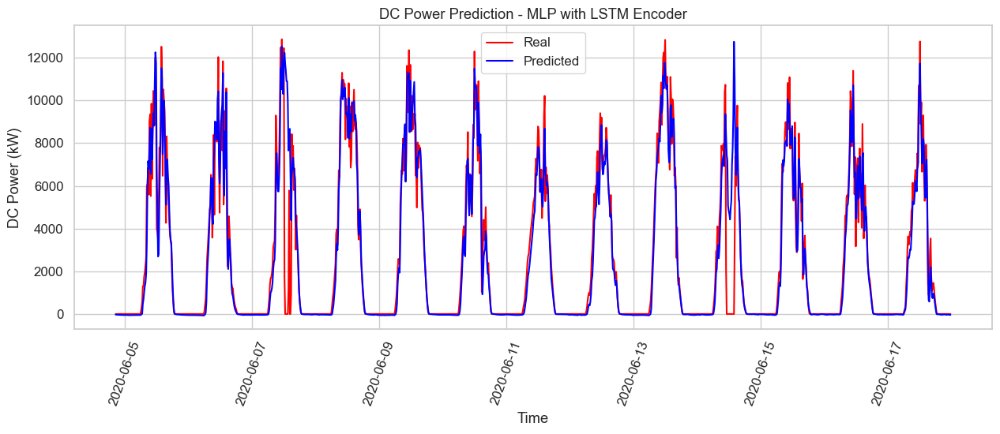

In [119]:
# Visualize the results
plt.plot(scores['datetime'],scores['real DC'], color = 'red', label = 'Real')
plt.plot(scores['datetime'],scores['test_preds'], color = 'blue', label = 'Predicted')
plt.title('DC Power Prediction - MLP with LSTM Encoder')
plt.xticks(rotation=70)
plt.xlabel('Time')
plt.ylabel('DC Power (kW)')
plt.legend()
plt.show()

### LSTM + CNN yapalım. Yine olay 15 dkda bir

In [120]:
X = []
Y = []
T = 1

for i in range(T, X_train.shape[0]):
    x = X_train[i-T:i,:]
    X.append(x)
    y = X_train[i,:]
    Y.append(y)
    
X,Y=np.array(X),np.array(Y)

subseq = 1
X = X.reshape(X.shape[0],subseq,X.shape[1],X.shape[2])
X.shape

(1892, 1, 1, 3)

In [123]:
from keras.models import Sequential
from keras.layers import TimeDistributed, Conv1D, MaxPooling1D, Flatten, LSTM, Dense
from keras.callbacks import EarlyStopping
import keras

def cnn_lstm():
    model = Sequential()
    model.add(TimeDistributed(Conv1D(filters=14, kernel_size=1, activation="sigmoid",
                                     input_shape=(X.shape[2], X.shape[3]))))
    model.add(TimeDistributed(MaxPooling1D(pool_size=1)))
    model.add(TimeDistributed(Flatten()))
    model.add(LSTM(21, activation="tanh", return_sequences=True))
    model.add(LSTM(14, activation="tanh", return_sequences=True))
    model.add(LSTM(7, activation="tanh"))
    model.add(Dense(3, activation="sigmoid"))
    model.add(Dense(1))
    return model


model = cnn_lstm()
opt = keras.optimizers.Adam(learning_rate=0.0003)
early_stop = EarlyStopping(monitor='val_loss', patience=10)
model.compile(optimizer=opt, loss='mse')

In [124]:
epochs = 100
batch = 16
history = model.fit(X, Y, epochs=epochs, batch_size=batch, validation_split=.1, callbacks=[early_stop], verbose=1).history

Epoch 1/100
107/107 [==============================] - 3s 6ms/step - loss: 0.3767 - val_loss: 0.3138
Epoch 2/100
107/107 [==============================] - 0s 985us/step - loss: 0.2275 - val_loss: 0.1365
Epoch 3/100
107/107 [==============================] - 0s 999us/step - loss: 0.0988 - val_loss: 0.0776
Epoch 4/100
107/107 [==============================] - 0s 987us/step - loss: 0.0797 - val_loss: 0.0733
Epoch 5/100
107/107 [==============================] - 0s 1ms/step - loss: 0.0773 - val_loss: 0.0712
Epoch 6/100
107/107 [==============================] - 0s 1ms/step - loss: 0.0750 - val_loss: 0.0688
Epoch 7/100
107/107 [==============================] - 0s 953us/step - loss: 0.0718 - val_loss: 0.0651
Epoch 8/100
107/107 [==============================] - 0s 962us/step - loss: 0.0666 - val_loss: 0.0590
Epoch 9/100
107/107 [==============================] - 0s 954us/step - loss: 0.0580 - val_loss: 0.0489
Epoch 10/100
107/107 [==============================] - 0s 941us/step - loss: 0

Epoch 80/100
107/107 [==============================] - 0s 896us/step - loss: 0.0074 - val_loss: 0.0054
Epoch 81/100
107/107 [==============================] - 0s 900us/step - loss: 0.0074 - val_loss: 0.0054
Epoch 82/100
107/107 [==============================] - 0s 870us/step - loss: 0.0074 - val_loss: 0.0053
Epoch 83/100
107/107 [==============================] - 0s 865us/step - loss: 0.0074 - val_loss: 0.0054
Epoch 84/100
107/107 [==============================] - 0s 858us/step - loss: 0.0074 - val_loss: 0.0053
Epoch 85/100
107/107 [==============================] - 0s 862us/step - loss: 0.0074 - val_loss: 0.0054
Epoch 86/100
107/107 [==============================] - 0s 857us/step - loss: 0.0074 - val_loss: 0.0054
Epoch 87/100
107/107 [==============================] - 0s 858us/step - loss: 0.0074 - val_loss: 0.0055
Epoch 88/100
107/107 [==============================] - 0s 854us/step - loss: 0.0074 - val_loss: 0.0055
Epoch 89/100
107/107 [==============================] - 0s 859us

In [125]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_1 (TimeDi  (None, 1, 1, 14)          56        
 stributed)                                                      
                                                                 
 time_distributed_2 (TimeDi  (None, 1, 1, 14)          0         
 stributed)                                                      
                                                                 
 time_distributed_3 (TimeDi  (None, 1, 14)             0         
 stributed)                                                      
                                                                 
 lstm_10 (LSTM)              (None, 1, 21)             3024      
                                                                 
 lstm_11 (LSTM)              (None, 1, 14)             2016      
                                                      

In [126]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=[x for x in range(len(history['loss']))], y=history['loss'],
                    mode='lines',
                    name='train loss'))

fig.add_trace(go.Scatter(x=[x for x in range(len(history['val_loss']))], y=history['val_loss'],
                    mode='lines',
                    name='validation loss'))

fig.update_layout(title="CNN-LSTM Loss",
                  yaxis=dict(title="Loss"),
                  xaxis=dict(title="Epoch"))

fig.show()

In [127]:
Xtt = []
Ytt = []
T = 1

for i in range(T, X_test.shape[0]):
    x = X_test[i-T:i,:]
    Xtt.append(x)
    y = X_test[i,:]
    Ytt.append(y)
    
    
Xtt,Ytt=np.array(Xtt),np.array(Ytt)
Xtt.shape

(1260, 1, 3)

In [128]:
Xtt = Xtt.reshape(Xtt.shape[0],subseq,Xtt.shape[1],Xtt.shape[2])
X_pred = model.predict(Xtt)

40/40 [==============================] - 0s 433us/step


In [129]:
X_pred.shape

(1260, 1)

In [130]:
target = test[['DC_POWER']].values
target = target.reshape(target.shape[0],1)
sct = MinMaxScaler()
target = sct.fit_transform(target)
testind = test.iloc[1:]

In [131]:
testind.shape

(1260, 3)

In [132]:
test.shape

(1261, 3)

In [134]:
target.shape

(1261, 1)

In [135]:
X_pred = sct.inverse_transform(X_pred)
X_pred = pd.DataFrame(X_pred)
X_pred.index = testind.index
X_pred['MODULE_TEMPERATURE'],X_pred['IRRADIATION'],X_pred['DC_POWER'] = test['MODULE_TEMPERATURE'],test['IRRADIATION'],test['DC_POWER']

In [136]:
X_pred = X_pred.rename(columns={0: "test_preds"})

In [137]:
scores = X_pred
scores['datetime'] = df_timestamp.loc[630:]
scores['real DC'] = scores['DC_POWER']
scores["loss_mae"] = (scores['real DC'] - scores['test_preds']).abs()

In [139]:
# Three sigma way
mean = scores['loss_mae'].mean()
std = scores['loss_mae'].std()
lower_bound = mean - 3 * std
upper_bound = mean + 3 * std
scores['Threshold'] = upper_bound
scores['Anomaly'] = np.where((scores['loss_mae'] < lower_bound) | (scores['loss_mae'] > upper_bound), 1, 0)

scores.describe().T

,count,mean,min,25%,50%,75%,max,std
test_preds,1260.0,2845.266357,329.149384,445.54509,629.860168,5563.299561,10109.368164,3134.337158
MODULE_TEMPERATURE,1260.0,29.636087,18.140415,20.84049,23.130767,38.815374,60.75705,11.066219
IRRADIATION,1260.0,0.213857,0.0,0.0,0.015325,0.424359,1.221652,0.285984
DC_POWER,1260.0,2586.661481,0.0,0.0,60.857143,5203.142857,12864.28571,3513.470837
datetime,1260,2020-06-11 09:54:08.571428608,2020-06-04 20:30:00,2020-06-08 03:11:15,2020-06-11 09:52:30,2020-06-14 16:33:45,2020-06-17 23:45:00,NaN
real DC,1260.0,2586.661481,0.0,0.0,60.857143,5203.142857,12864.28571,3513.470837
loss_mae,1260.0,882.588884,4.398926,415.437576,485.395966,863.289943,8229.232422,1032.587195
Threshold,1260.0,3980.350467,3980.350467,3980.350467,3980.350467,3980.350467,3980.350467,0.0
Anomaly,1260.0,0.023016,0.0,0.0,0.0,0.0,1.0,0.150013


In [140]:
fig = go.Figure(data=[go.Histogram(x=scores['loss_mae'])])
fig.update_layout(title="Error distribution",
                 xaxis=dict(title="Error delta between predicted and real data [DC Power]"),
                 yaxis=dict(title="Data point counts"))
fig.show()

In [141]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=scores['datetime'],
                         y=scores['loss_mae'],
                         name="Loss"))
fig.add_trace(go.Scatter(x=scores['datetime'],
                         y=scores['Threshold'],
                         name="Threshold"))

fig.update_layout(title="Error Timeseries and Threshold",
                 xaxis=dict(title="DateTime"),
                 yaxis=dict(title="Loss"))
fig.show()

In [142]:
scores['Anomaly'].value_counts()

Anomaly
0    1231
1      29
Name: count, dtype: int64

In [143]:
anomalies = scores[scores['Anomaly'] == 1][['real DC']]
anomalies = anomalies.rename(columns={'real DC':'anomalies'})
scores = scores.merge(anomalies, left_index=True, right_index=True, how='left')

In [144]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=scores["datetime"], y=scores["real DC"],
                    mode='lines',
                    name='DC Power'))

fig.add_trace(go.Scatter(x=scores["datetime"], y=scores["anomalies"],
                    name='Anomaly',
                    mode='markers',
                    marker=dict(color="red",
                                size=11,
                                line=dict(color="red",
                                          width=2))))

fig.update_layout(title_text="Anomalies Detected CNN-LSTM")

fig.show()

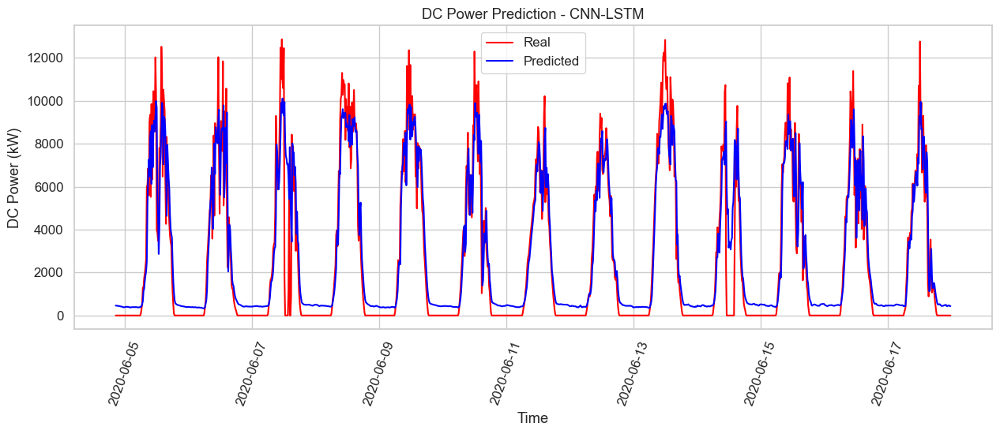

In [145]:
# Visualize the results
plt.plot(scores['datetime'],scores['real DC'], color = 'red', label = 'Real')
plt.plot(scores['datetime'],scores['test_preds'], color = 'blue', label = 'Predicted')
plt.title('DC Power Prediction - CNN-LSTM')
plt.xticks(rotation=70)
plt.xlabel('Time')
plt.ylabel('DC Power (kW)')
plt.legend()
plt.show()